In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
import re
import time
from scipy import stats

import warnings
warnings.filterwarnings("ignore")
import scipy.stats

#Quality of image:
%config InlineBackend.figure_format = 'svg'
import os

pd.set_option('display.max_columns', 100)

# Import my own functions from utils file:
import import_ipynb
from utils_Rental_Cost import *

importing Jupyter notebook from utils_Rental_Cost.ipynb


In [2]:
dataDirectory = os.path.join(os.path.dirname(os.getcwd()),'Rental_Cost\\data')
imageDirectory = os.path.join(os.path.dirname(os.getcwd()),'Rental_Cost\\images\\EDA')

In [3]:
df = pd.read_csv(dataDirectory + "\\rental_houses_Tohid.csv")
print(df.shape)
df.head(2)

(10692, 13)


,city,area,rooms,bathroom,parking,floor,petFriendly,furnished,hoa,rent,tax,fireInsurance,total
0,São Paulo,70,2,1,1,7,acept,furnished,2065,3300,211,42,5618
1,São Paulo,320,4,4,0,20,acept,not furnished,1200,4960,1750,63,7973


In [4]:
metadata = make_metadata(df)

catFeatures, catCnt, cat_df = make_typedf(df, metadata, 'categorical')
ordFeatures, ordCnt, ord_df = make_typedf(df, metadata, 'ordinal')
numFeatures, numCnt, num_df = make_typedf(df, metadata, 'numeric')
binFeatures, binCnt, bin_df = make_typedf(df, metadata, 'binary')

# Let us take a look at cat features:
ordFeatures

['area',
 'rooms',
 'bathroom',
 'parking',
 'floor',
 'hoa',
 'rent',
 'tax',
 'fireInsurance',
 'total']

In [5]:
df.describe()

,area,rooms,bathroom,parking,floor,hoa,rent,tax,fireInsurance,total
count,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,1.069200e+04,10692.000000,10692.000000,10692.000000,1.069200e+04
mean,149.217920,2.506079,2.236813,1.609147,5.326319,1.174022e+03,3896.247194,366.704358,53.300879,5.490487e+03
std,537.016942,1.171266,1.407198,1.589521,5.870492,1.559231e+04,3408.545518,3107.832321,47.768031,1.648473e+04
min,11.000000,1.000000,1.000000,0.000000,1.000000,0.000000e+00,450.000000,0.000000,3.000000,4.990000e+02
25%,56.000000,2.000000,1.000000,0.000000,1.000000,1.700000e+02,1530.000000,38.000000,21.000000,2.061750e+03
50%,90.000000,2.000000,2.000000,1.000000,3.000000,5.600000e+02,2661.000000,125.000000,36.000000,3.581500e+03
75%,182.000000,3.000000,3.000000,2.000000,8.000000,1.237500e+03,5000.000000,375.000000,68.000000,6.768000e+03
max,46335.000000,13.000000,10.000000,12.000000,301.000000,1.117000e+06,45000.000000,313700.000000,677.000000,1.120000e+06


**Insights:**
- There is a huge differences between max and mean in features: area, floor, rent, tax, fireInsurance, total.
- It is very likely we have outliers.
- Usually, the numerical features are in form of float data type. However, in this dataset all of them have int datatype. Because of that, following the metadata function, they are saved as ordinal variables.

In [6]:
numFeatures = ['area', 'hoa', 'rent', 'tax', 'fireInsurance', 'total']
ordFeatures = ['rooms', 'bathroom', 'parking', 'floor']

**Outliers in Numerical Features:**
- We can use boxplot.

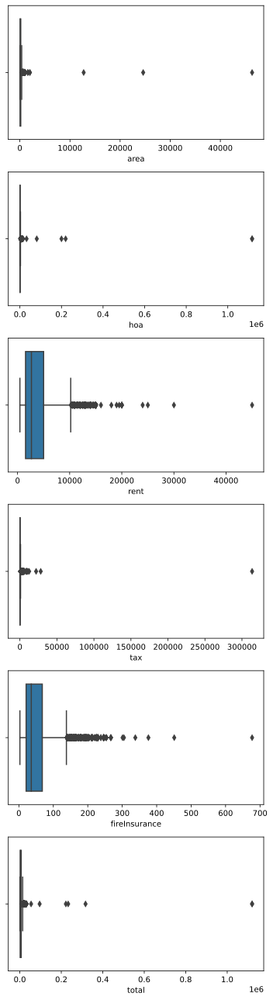

In [7]:
make_box_plot(df=df, cols=numFeatures)
plt.savefig(imageDirectory + '\\numerical_box_1.png', dpi=140,  bbox_inches='tight')

In [8]:
# Let us make a backup at this step:
df2 = df.copy(deep=True)

#df = df2.copy(deep=True)

**Treating of outliers in numerical features:**
- All numerical features show some extreme values in box plot.
- Because of that we do not have a clear box plot, especially in area, hoa, tax, total feautres.
- We will apply interqurtile method to treat outliers.

In [9]:
df, non_outlier_df, dropped_index =removeOutliers_IQR(df=df, num_Feat= numFeatures, nIQR = 2.0, inplace=False)


For nIQR = 2.00
Count of dropped rows: 1386
Percentage of dropped rows: 12.963%


### IQR analysis:
- Applying interqurtile approach with a coefficient of 2 will drop about 13% of data.
- Due to large size of droping data, we will check manually.

### Outlier in area features: 

In [10]:
df.loc[df['area']>1200].shape[0]

7

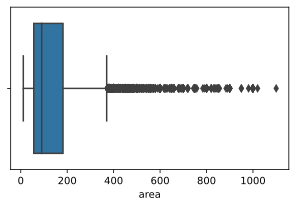

In [11]:
make_box_plot(df.loc[df['area']<1210], ['area'])

### Outlier in "hoa" features: 

In [12]:
df.loc[df['hoa']>9000].shape[0]

13

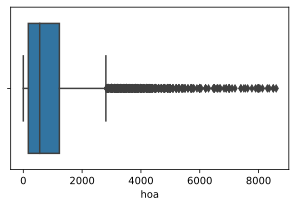

In [13]:
make_box_plot(df.loc[df['hoa']<9000], ['hoa'])

### Outlier in "tax" features: 

In [14]:
df.loc[df['tax']>6000].shape[0]

11

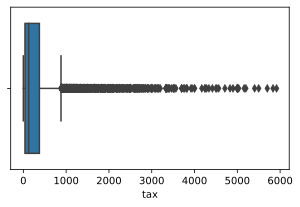

In [15]:
make_box_plot(df.loc[df['tax']<6000], ['tax'])

In [16]:
# Let us make a backup at this step:
df3 = df.copy(deep=True)

#df = df3.copy(deep=True)

In [17]:
count1 = df.shape[0] 
df = df.loc[df['area']<1200]
df = df.loc[df['hoa']<9000]
df = df.loc[df['tax']<6000]
count2 = df.shape[0] 
droppedCnt = count1 - count2
droppedPercent = 100 * droppedCnt / count1
print('Count of dropped rows: {}'.format(droppedCnt))
print('Percentage of dropped rows: {:.3f}%'.format(droppedPercent))

Count of dropped rows: 30
Percentage of dropped rows: 0.281%


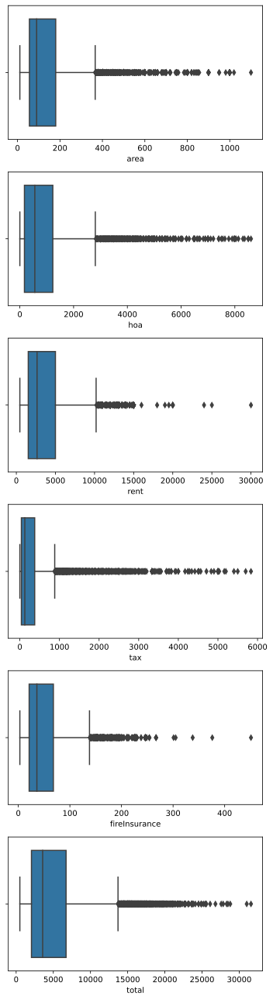

In [18]:
make_box_plot(df=df, cols=numFeatures)
plt.savefig(imageDirectory + '\\numerical_box_2.png', dpi=140,  bbox_inches='tight')

**Insights:**
- By removing outliers, we have a much better resolution in box plot.
- By manual treatment of outliers, we just dropped 30 records or 0.281% of data.
- While using interquartile approache would delete 1386 records or 12.963% of data.
- Now, we will check ordinal variables.

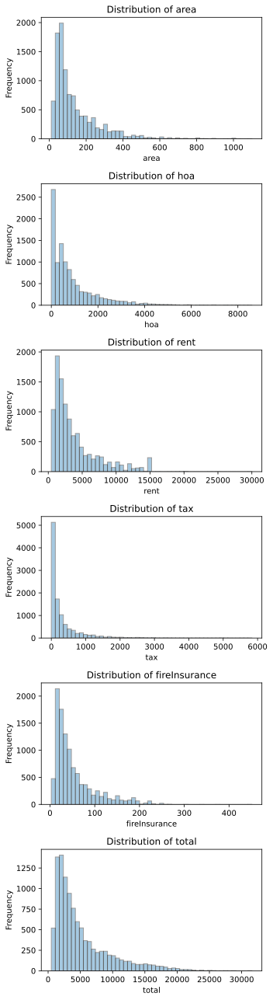

In [19]:
make_multi_histogram(df, cols=numFeatures, xRotation=0, width=5, height=3)
plt.savefig(imageDirectory + '\\histogram.png', dpi=140,  bbox_inches='tight')

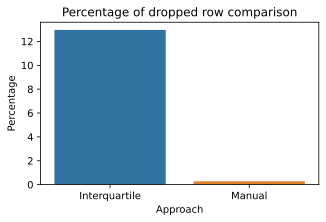

In [20]:
fig, ax = plt.subplots(figsize=(5,3))
sns.barplot(x= ['Interquartile', 'Manual'], y = [12.963, 0.281], ax=ax)
ax.set_title('Percentage of dropped row comparison')
ax.set_xlabel('Approach')
ax.set_ylabel('Percentage');
plt.savefig(imageDirectory + '\\dropped_row.png', dpi=140,  bbox_inches='tight')

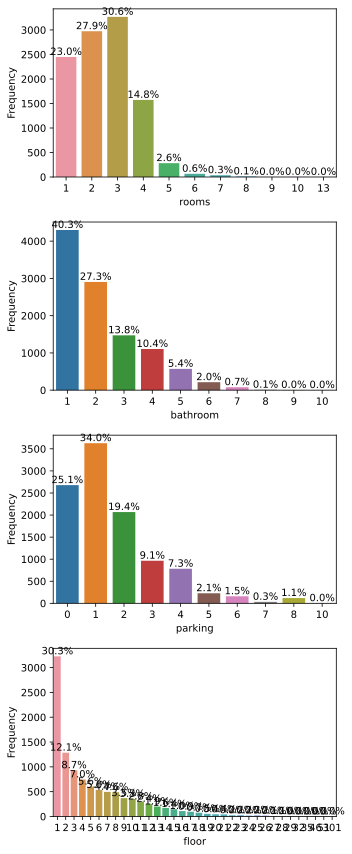

In [21]:
make_count_plot(df, ordFeatures, annotate=True, xRotation = 0)
plt.savefig(imageDirectory + '\\ordinal_1.png', dpi=140,  bbox_inches='tight')

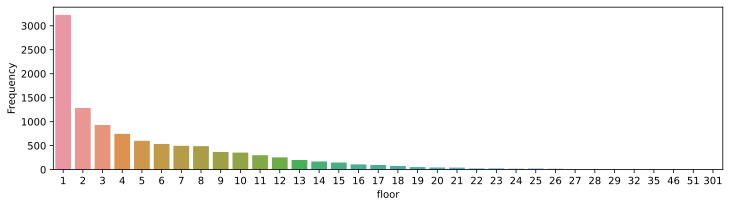

In [22]:
make_count_plot(df, ['floor'], annotate=False, xRotation = 0, width=12)
plt.savefig(imageDirectory + '\\floor.png', dpi=140,  bbox_inches='tight')

### Insights:
- **rooms:**
    - More than 90% of the homes have 1,2 or 3 rooms.
    - Only 1.0% of records have more than 5 rooms.
- **bathroom:**
    - Most of homes have one bathroom and by increasing of the number of bathrooms, the frequency of homes is decreasing. 
    - Only 1.0% of records have more than 5 bathrooms.
- **Parking:**
    - The most common number of parking is one.
- **Number of floor:**
    - The most common count of floor is one.
    - It is likely that we have an outlier in floor,
    - It is better to check the floor feature separately.

In [23]:
# Making backup
df5 = df.copy(deep=True)

#df = df5.copy(deep=True)

**Checking Modifying Floor Feature:**

In [24]:
max_floor = df['floor'].max()
print('Maximum floor is {:d} in the dataset.'.format(max_floor))

Maximum floor is 301 in the dataset.


### Insights:
- The maximum floor number is **301** which is an outlier.
- We will drop this extreme value from the dataset.

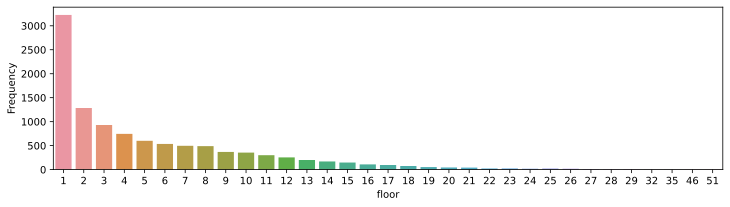

In [25]:
max_floor = df['floor'].max()
df.drop((df[df['floor']==max_floor]).index, inplace = True)

make_count_plot(df, ['floor'], annotate=False, xRotation = 0, width=12)
plt.savefig(imageDirectory + '\\floor_2.png', dpi=140,  bbox_inches='tight')

In [26]:
# Making backup
df6 = df.copy(deep=True)

#df = df6.copy(deep=True)

**Question:**
- Whether the total feature always higher than rent feature?

In [27]:
indexLst = df.loc[df['total']>df['rent']].index
print('In {:0.2f}% of data, the total value is higher than rent value.'.format(len(indexLst)*100/df.shape[0]))

In 100.00% of data, the total value is higher than rent value.


### Categorical varaibles

In [28]:
print(catFeatures)
cat_df

['city', 'petFriendly', 'furnished']


,feature,uniqueCnt
0,city,5
1,petFriendly,2
2,furnished,2


In [29]:
print(df['petFriendly'].unique())
print(df['furnished'].unique())

['acept' 'not acept']
['furnished' 'not furnished']


**Updating Categorical Features:**

In [30]:
df.loc[df['petFriendly']== 'acept', 'petFriendly'] = 'Yes'
df.loc[df['petFriendly']== 'not acept', 'petFriendly'] = 'No'

df.loc[df['furnished']== 'furnished', 'furnished'] = 'Yes'
df.loc[df['furnished']== 'not furnished', 'furnished'] = 'No'

print(df['petFriendly'].unique())
print(df['furnished'].unique())

['Yes' 'No']
['Yes' 'No']


In [31]:
print(df['petFriendly'].unique())
print(df['furnished'].unique())

['Yes' 'No']
['Yes' 'No']


In [32]:
# Making backup
df7 = df.copy(deep=True)

#df = df7.copy(deep=True)

**Distribution of Categorical Features:**

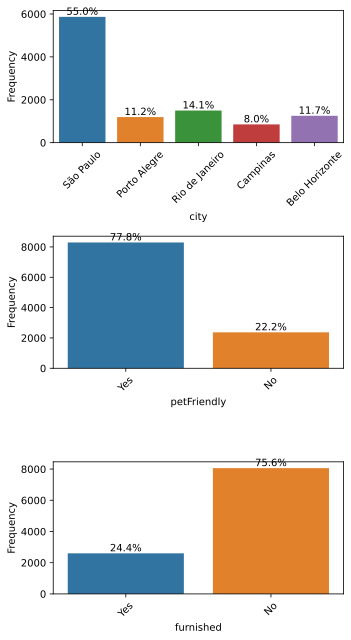

In [33]:
make_count_plot(df, catFeatures, annotate=True, xRotation=45)
plt.savefig(imageDirectory + '\\categorical.png', dpi=140,  bbox_inches='tight')

**Insights:**
- More than 55% of the homes are belong to Sao Paulo,
- More than 77% of the homes are pet friendly,
- More than 75% of the homes are not furnished.

### Multy variable analysis:
**- City and Total**

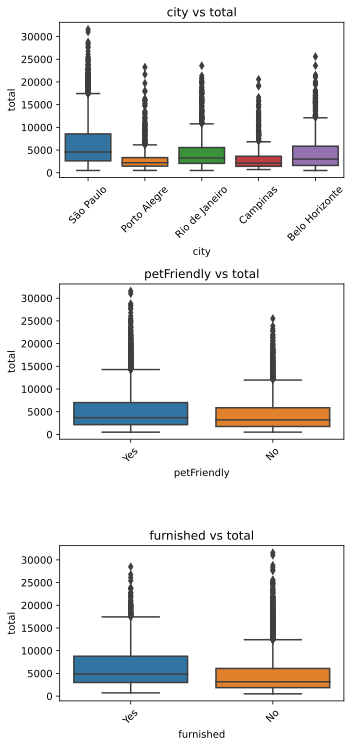

In [34]:
make_multi_box_plot(df, cols=catFeatures,  refCol='total', xRotation=45)
plt.savefig(imageDirectory + '\\multi_cat.png', dpi=140,  bbox_inches='tight')

### Insights:
**City:**
    - The most expensive city for home renting: Sao Paulo.
    - The cheapest city for home renting: Porto Alerge.
**PetFriendly:**
    - PetFreindly homes are quite expensive than non PetFriendly ones.
**Furnished:**    
    - Furnished homes are quite expensive than non furnished ones.

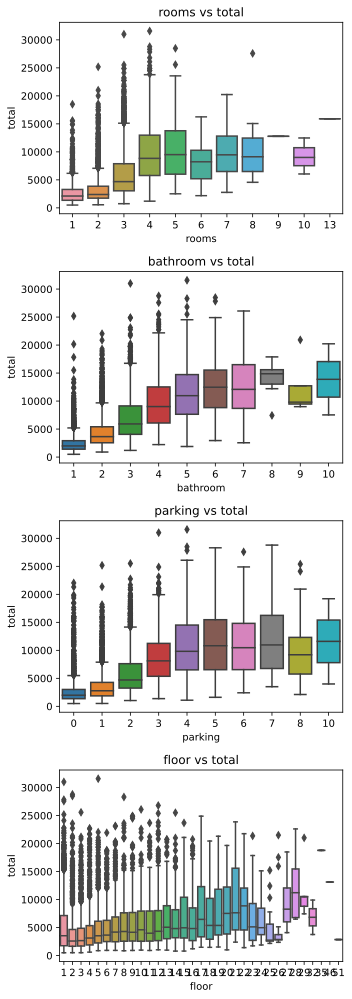

In [35]:
make_multi_box_plot(df, cols=ordFeatures,  refCol='total', xRotation=0)
plt.savefig(imageDirectory + '\\multi_ord.png', dpi=140,  bbox_inches='tight')

### Insights:
**Rooms, Bathrooms, Parking:**
   - By increasing of number of rooms from 1 to 5, the total rent is increased.
   - However, beyond 5 rooms no impact of rooms on total is observable. 

**Bathrooms:**
   - By increasing of number of bathrooms from 1 to 6, the total rent is increased.
   - However, beyond 6 no impact of number of bathrooms on total is observable. 

**Parkings:**
   - By increasing of number of parkings from 0 to 4, the total rent is increased.
   - However, beyond 4 no impact of number of parkings on total is observable. 

**Floor:**
   - A general trend show that the more floor in building, the more the total rent.
       - Probably, they are newer property.
       - Probably, they provide better service.

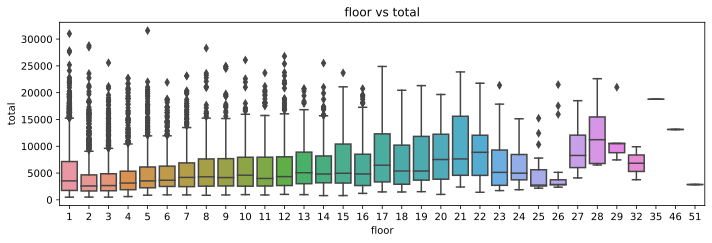

In [36]:
make_multi_box_plot(df, cols=['floor'],  refCol='total', xRotation=0, width=10)
plt.savefig(imageDirectory + '\\multi_floor.png', dpi=140,  bbox_inches='tight')

In [37]:
numFeatures

['area', 'hoa', 'rent', 'tax', 'fireInsurance', 'total']

In [38]:
numCols = [x for x in numFeatures if x!='total']
make_scatter_plot(df, numCols,  refCol='total', xRotation=0)

**Insights:**
- Meaningful relation between:
    - rent and total
    - fireInsurance and total

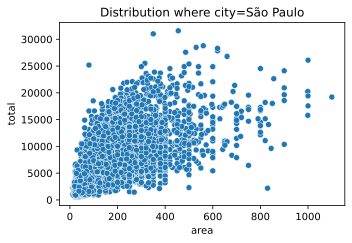

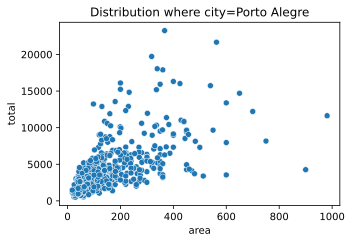

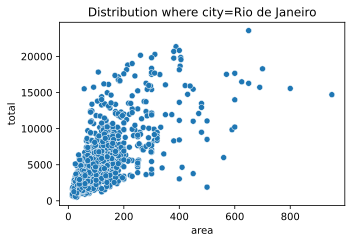

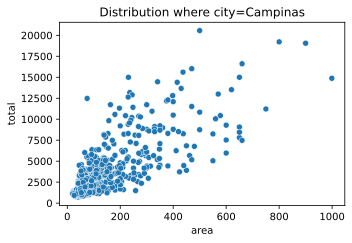

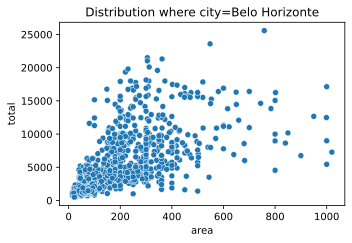

In [39]:
#checkCols = ['hoa', 'tax', 'area']
cityLst = df['city'].unique()
for cityName in cityLst:
    scatter_plot_specified(df, cols=['area'],  refCol='total', varName='city', varData=cityName, hueCol=None, xRotation=0)

### Insights:
- The relation between the variables "area" and "total" is **not a simple linear relation**.
- By the way, the more the area the more the **variance** of total variable.

**Smaller homes vs bigger homes:**
- The total value of smaller homes are quite close to each other.
- In contrast, total value in bigger homes have a bigger variance. 
- Probably, bigger homes have a big range of features (such as modern features, age of building, neighborhood) that can impact the total value so much.

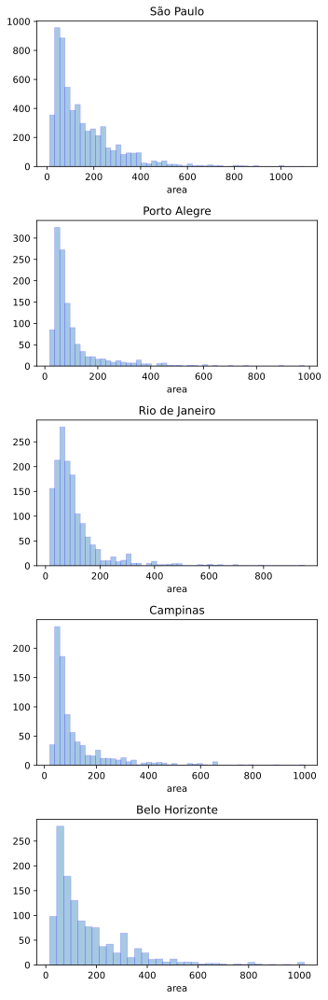

In [40]:
cityLst = df['city'].unique()
cnt = len(cityLst)
fig, axes = plt.subplots(cnt, 1, figsize=(5,3*cnt))


for i, cityName in enumerate(cityLst):
    data = df[df['city'] == cityName]
    sns.distplot(data['area'],  kde=False, label=cityName, hist=True, hist_kws=dict(edgecolor="b", linewidth=0.5), ax = axes[i])
    axes[i].set_title(cityName)
    
fig.tight_layout()
plt.savefig(imageDirectory + '\\area_dist.png', dpi=140,  bbox_inches='tight')

### Insights:
**Skewness:**
- Area is a feature with skewness to the right in all cities.

**Dominant area size:**
- In all cities, the dominant size is in a range of 50 to 100.

**Belo Horizente and Sao Paulo:**
- Compare to other three cities, they have more larger homes.

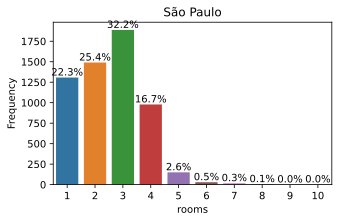

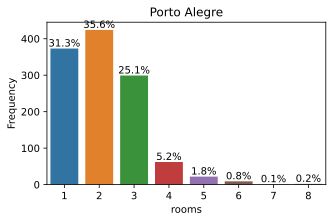

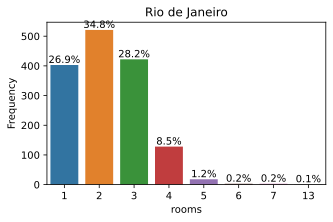

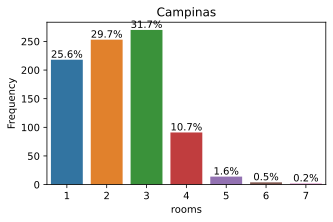

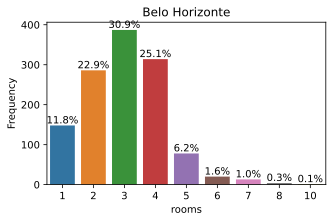

In [41]:
for i, cityName in enumerate(cityLst):
    data = df[df['city']==cityName]
    make_count_plot(df=data, cols=['rooms'], annotate=True, xRotation = 0, title=cityName)
    nameTemp = "\\room_in_" + cityName + ".png"
    plt.savefig(imageDirectory + nameTemp, dpi=140,  bbox_inches='tight')

- Cities where the most common homes have **three rooms**:
    - Sao Paulo, Campinas, Belo Horizente <br><br>
- Cities where the most common homes have **two rooms**:
    - Rio de Janeiro, Porto Alegre <br><br>

- The general trend of distribution of homes with more than three rooms: the more the number of rooms the less the frequency.
- But the **exception** is Belo Horizente where count of 4-bedrooms homes are more than 1-bedroom and 2-bedrooms.

In [42]:
# Making a Series for comparison city in terms of homes with more than 3 rooms:
roomData = pd.Series(index=cityLst)

for i, cityName in enumerate(roomData.index):
    temp = df.loc[df['city']==cityName, 'rooms'].value_counts(normalize=True)
    roomData[i] = temp[temp.index>3].sum()
    roomData[i] = round(100*roomData[i], 2)
roomData

São Paulo         20.15
Porto Alegre       8.05
Rio de Janeiro    10.21
Campinas          13.03
Belo Horizonte    34.37
dtype: float64

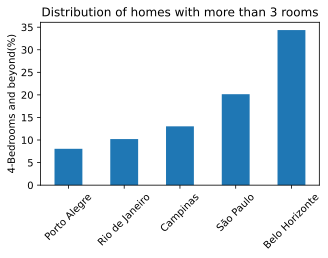

In [43]:
roomData.sort_values(ascending=True, inplace=True)

fig, ax = plt.subplots(figsize=(5, 3))
roomData.plot(kind='bar', ax = ax)    
ax.set_title('Distribution of homes with more than 3 rooms')
ax.tick_params(axis='x', labelrotation=45)
ax.set_ylabel('4-Bedrooms and beyond(%)');
#ax.set_xlabel('City')
plt.savefig(imageDirectory + '\\4bedrooms_city.png', dpi=140,  bbox_inches='tight')

### Feature: "total"
- This feature is sum of all cost variables. In other words:
- total = rent + fireInsurance + hoa + tax
- We are looking for predicting of rent. When rent is not known, then the total is also unknown. So, we can drop "total".

In [44]:
df.drop(['total'], axis=1, inplace=True)

### Four new Features:
- allSpace = rooms + bathroom + parking
- allCost = fireInsurance + hoa + tax
- costPerArea = allCost/area
- costPerRoom = allCost/allSpace

In [45]:
df['allSpace'] = df['rooms'] + df['bathroom'] +df['parking']
df['allCost'] = df['fireInsurance'] + df['hoa'] + df['tax']
df['costPerArea'] = df['allCost'] / df['area']
df['costPerRoom'] = df['allCost'] / df['allSpace']

In [46]:
numCols = df.columns.tolist()
numCols = [col for col in numCols if col not in catFeatures]

In [47]:
# Moving rent to the end of the feature names:
numCols = [x for x in numCols if x!='rent']
numCols.append('rent')
numCols

['area',
 'rooms',
 'bathroom',
 'parking',
 'floor',
 'hoa',
 'tax',
 'fireInsurance',
 'allSpace',
 'allCost',
 'costPerArea',
 'costPerRoom',
 'rent']

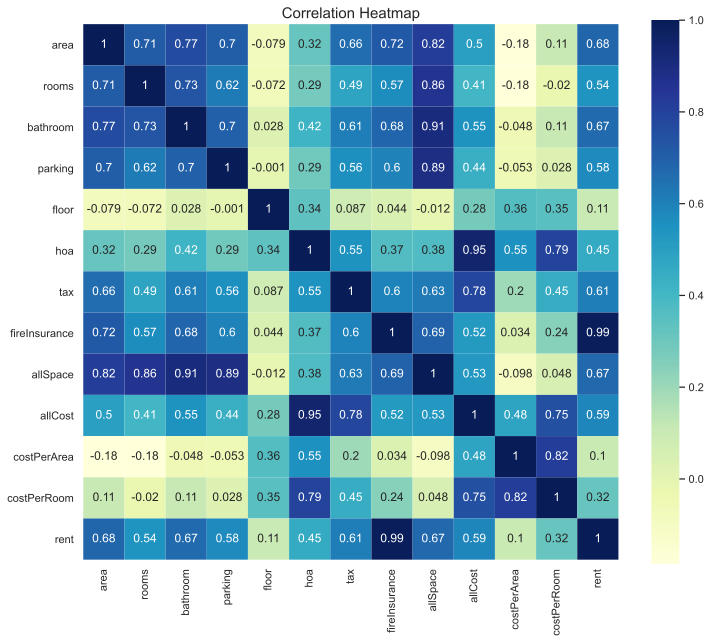

In [48]:
makeHeatmap(df=df, cols=numCols, annot = True, line=False)

**Insights:**
- It is clear that rent is strongly correlated with fireInsurence.
- We expect that we can reach good score in prediction of rent.
- The minimum correlation is between rent and floor.
- There is no strong multicollinearity for the rest of original features. 

### Exporting Data for futureuse:

In [49]:
df.to_csv(dataDirectory + "\\rental_houses_Tohid_Final.csv", index=False)